# **Pre-trained ResNet-18 model trained on the KDEF dataset with input image resolution of 28x28.**

In [1]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 7.6 MB/s eta 0:00:00


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
from torch.utils.data import Dataset
import os
import copy
from tensorboardX import SummaryWriter
from PIL import Image
import torchvision.transforms as transforms
import random
plt.ion()   # interactive mode
%matplotlib inline

In [3]:
# Set fixed seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [4]:
from zipfile import ZipFile
import os

zip_path = '/content/KEDF_downsample_28x28.zip'

extract_to = '/content'

os.makedirs(extract_to, exist_ok=True)

with ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)

print(f'✅ Files extracted to: {extract_to}')

✅ Files extracted to: /content


In [5]:
import os

classes = {
    "AF": 0, "AN": 1, "DI": 2, "HA": 3, "NE": 4, "SA": 5, "SU": 6
}

root='/content/KEDF_downsample_28x28'
invalid_files = []

for path, subdirs, files in os.walk(root):
    for name in files:
        if len(name) >= 6:
            emotion_code = name[4:6]
            if emotion_code not in classes:
                invalid_files.append(os.path.join(path, name))

# Print the problematic files
print("Found {} problematic files:".format(len(invalid_files)))
for file in invalid_files:
    print(file)

Found 0 problematic files:


In [6]:
class KDEFDataset(Dataset):
    def __init__(self, root='/content/KEDF_downsample_28x28', transforms_=None, idx=[]):
        self.transform = transforms_
        self.files = []

        for path, subdirs, files in os.walk(root):
            for name in files:
                self.files.append(os.path.join(path, name))

        self.files =  [self.files[i] for i in idx]
        self.classes = {
             "AF":0,
             "AN":1,
             "DI":2,
             "HA":3,
             "NE":4,
             "SA":5,
             "SU":6
        }
        for f in self.files:
          name = f.split('/')[-1]
          emotion_code = name[4:6]
          if emotion_code not in self.classes:
              print(f"Invalid file: {f} (code: {emotion_code})")

        for index in range(4900):
            filepath = self.files[index % len(self.files)]
            filename = filepath.split('/')[-1]
            if filename[4:6] not in self.classes:
                print(filepath)

    def __getitem__(self, index):
        filepath = self.files[index % len(self.files)]

        filename = filepath.split('/')[-1]
        img = self.transform(Image.open(filepath))
        label = self.classes[filename[4:6]]

        return img, label

    def __len__(self):
        return len(self.files)

Load Data
---------


In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
    'val': transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5])
    ]),
}

idx = np.random.permutation(4900)
idx = {'val': idx[0:490], 'train': idx[490:]}

g = torch.Generator()
g.manual_seed(42)

dataloaders = {
    x: torch.utils.data.DataLoader(
        KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
        batch_size=32,
        shuffle=True,
        generator=g
    )
    for x in ['train', 'val']
}

dataset_sizes = {x: len(idx[x]) for x in ['train', 'val']}
class_names = 7

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Visualize a few images


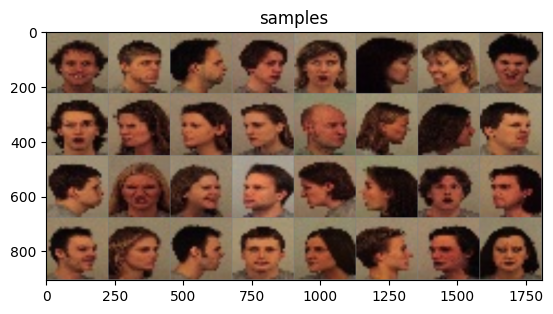

In [8]:
def imshow(inp, title=None):
    """Imshow for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# Make a grid from batch
out = torchvision.utils.make_grid(inputs)

imshow(out, title='samples')

Training the model
------------------

Now, let's write a general function to train a model. Here, we will
illustrate:

-  Scheduling the learning rate
-  Saving the best model

In the following, parameter ``scheduler`` is an LR scheduler object from
``torch.optim.lr_scheduler``.



In [9]:
from tqdm import tqdm

def train_model(model, criterion, optimizer, scheduler, dataloaders, writer=None, i=0,  num_epochs=25):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                scheduler.step()
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for inputs, labels in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                labels = labels.to(device)

                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # statistics
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(
                phase, epoch_loss, epoch_acc))


            writer.add_scalar(phase+"/loss", epoch_loss, epoch)
            writer.add_scalar(phase+"/acc", epoch_acc, epoch)


            # deep copy the model
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                torch.save(model.state_dict(), 'saved/resnet_'+str(i)+'.pt')

        print()


    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model, best_acc

Visualizing the model predictions

In [10]:
import imageio
import os
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

def visualize_model_misclassified(model, dataloader, class_names, save_dir='misclassified', num_images=15, columns=3):
    os.makedirs(save_dir, exist_ok=True)
    was_training = model.training
    model.eval()
    images_so_far = 0
    rows = (num_images + columns - 1) // columns
    fig, axes = plt.subplots(rows, columns, figsize=(columns * 4, rows * 4))
    axes = axes.flatten()

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                if preds[j] != labels[j]:
                    if images_so_far >= num_images:
                        break

                    # --- Display in grid ---
                    ax = axes[images_so_far]
                    ax.axis('off')
                    ax.set_title(f'Pred: {class_names[int(preds[j])]},\nTrue: {class_names[int(labels[j])]}', fontsize=9)
                    imshow(inputs.cpu().data[j], ax=ax)

                    # --- Save image with overlay text ---
                    img = inputs[j].cpu().numpy().transpose(1, 2, 0)
                    img = (img * 0.5 + 0.5) * 255
                    img = img.astype(np.uint8)
                    img_pil = Image.fromarray(img)

                    draw = ImageDraw.Draw(img_pil)
                    font = ImageFont.load_default()
                    text = f'Predicted: {class_names[int(preds[j])]} | True: {class_names[int(labels[j])]}'
                    draw.rectangle([10, 10, 280, 25], fill=(255, 255, 255))
                    draw.text((10, 10), text, font=font, fill=(0, 0, 0))

                    img_pil.save(f'{save_dir}/misclassified_{images_so_far + 1}.jpg')

                    images_so_far += 1

    for k in range(images_so_far, len(axes)):
        axes[k].axis('off')

    plt.tight_layout()
    plt.show()
    model.train(mode=was_training)


def imshow(inp, ax=None, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.5, 0.5, 0.5])
    std = np.array([0.5, 0.5, 0.5])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    if ax is None:
        plt.imshow(inp)
    else:
        ax.imshow(inp)
    if title is not None:
        ax.set_title(title)


Finetuning the convnet
----------------------

Load a pretrained model and reset final fully connected layer.




Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 218MB/s]
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:224: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite order: `optimizer.step()` before `lr_scheduler.step()`.  Failure to do this will result in PyTorch skipping the first value of the learning rate schedule. See more details at https://pytorch.org/docs/stable/optim.html#how-to-adjust-learning-rate
  warnings.warn(


Epoch 0/19
----------


100%|██████████| 138/138 [00:10<00:00, 13.04it/s]


train Loss: 1.8094 Acc: 0.2735


100%|██████████| 16/16 [00:00<00:00, 17.19it/s]


val Loss: 1.5342 Acc: 0.4388

Epoch 1/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.88it/s]


train Loss: 1.2085 Acc: 0.5456


100%|██████████| 16/16 [00:00<00:00, 20.59it/s]


val Loss: 1.1446 Acc: 0.5571

Epoch 2/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.69it/s]


train Loss: 0.9133 Acc: 0.6508


100%|██████████| 16/16 [00:00<00:00, 21.62it/s]


val Loss: 0.8932 Acc: 0.6592

Epoch 3/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.59it/s]


train Loss: 0.7353 Acc: 0.7295


100%|██████████| 16/16 [00:00<00:00, 21.43it/s]


val Loss: 0.8031 Acc: 0.6755

Epoch 4/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.72it/s]


train Loss: 0.5990 Acc: 0.7844


100%|██████████| 16/16 [00:00<00:00, 21.87it/s]


val Loss: 0.8656 Acc: 0.6551

Epoch 5/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.74it/s]


train Loss: 0.4502 Acc: 0.8442


100%|██████████| 16/16 [00:00<00:00, 21.48it/s]


val Loss: 0.6723 Acc: 0.7388

Epoch 6/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.61it/s]


train Loss: 0.3971 Acc: 0.8735


100%|██████████| 16/16 [00:00<00:00, 21.48it/s]


val Loss: 0.6621 Acc: 0.7408

Epoch 7/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.65it/s]


train Loss: 0.3794 Acc: 0.8821


100%|██████████| 16/16 [00:00<00:00, 21.51it/s]


val Loss: 0.6558 Acc: 0.7327

Epoch 8/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.79it/s]


train Loss: 0.3519 Acc: 0.8905


100%|██████████| 16/16 [00:00<00:00, 21.98it/s]


val Loss: 0.6486 Acc: 0.7490

Epoch 9/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.79it/s]


train Loss: 0.3502 Acc: 0.8923


100%|██████████| 16/16 [00:00<00:00, 21.98it/s]


val Loss: 0.6526 Acc: 0.7469

Epoch 10/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.81it/s]


train Loss: 0.3248 Acc: 0.9018


100%|██████████| 16/16 [00:00<00:00, 21.16it/s]


val Loss: 0.6449 Acc: 0.7531

Epoch 11/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.85it/s]


train Loss: 0.3007 Acc: 0.9145


100%|██████████| 16/16 [00:00<00:00, 22.09it/s]


val Loss: 0.6484 Acc: 0.7592

Epoch 12/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.76it/s]


train Loss: 0.3129 Acc: 0.9050


100%|██████████| 16/16 [00:00<00:00, 21.05it/s]


val Loss: 0.6390 Acc: 0.7510

Epoch 13/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.98it/s]


train Loss: 0.3140 Acc: 0.9079


100%|██████████| 16/16 [00:00<00:00, 21.57it/s]


val Loss: 0.6518 Acc: 0.7490

Epoch 14/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.77it/s]


train Loss: 0.3095 Acc: 0.9084


100%|██████████| 16/16 [00:00<00:00, 21.70it/s]


val Loss: 0.6498 Acc: 0.7673

Epoch 15/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.61it/s]


train Loss: 0.3061 Acc: 0.9141


100%|██████████| 16/16 [00:00<00:00, 21.67it/s]


val Loss: 0.6446 Acc: 0.7531

Epoch 16/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.76it/s]


train Loss: 0.2982 Acc: 0.9204


100%|██████████| 16/16 [00:00<00:00, 20.93it/s]


val Loss: 0.6385 Acc: 0.7510

Epoch 17/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.68it/s]


train Loss: 0.3055 Acc: 0.9150


100%|██████████| 16/16 [00:00<00:00, 21.32it/s]


val Loss: 0.6373 Acc: 0.7551

Epoch 18/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.85it/s]


train Loss: 0.2958 Acc: 0.9161


100%|██████████| 16/16 [00:00<00:00, 19.19it/s]


val Loss: 0.6412 Acc: 0.7551

Epoch 19/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.96it/s]


train Loss: 0.2988 Acc: 0.9168


100%|██████████| 16/16 [00:00<00:00, 21.41it/s]


val Loss: 0.6415 Acc: 0.7633

Training complete in 3m 13s
Best val Acc: 0.767347
Showing misclassified examples for fold 0...


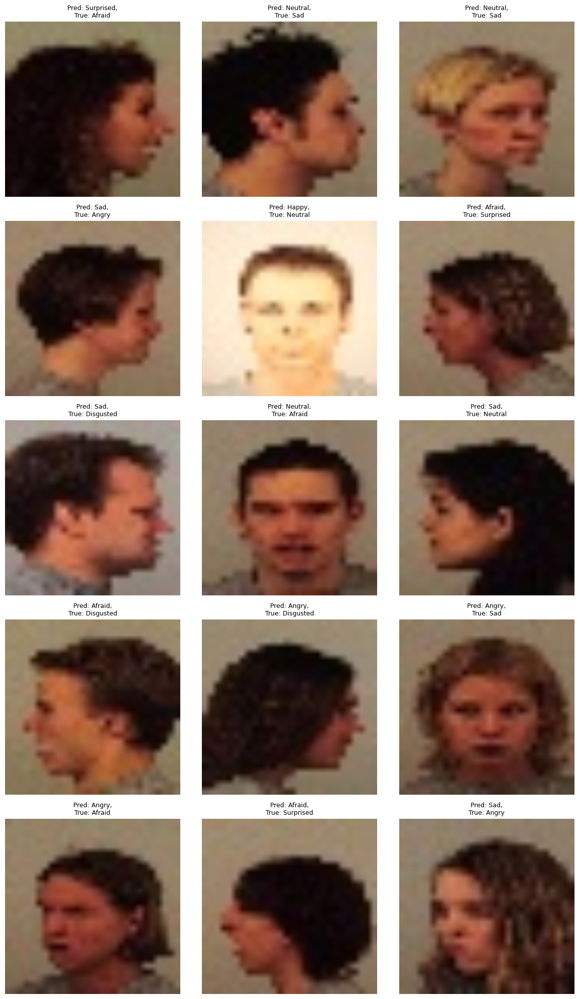




------------------------------------
 Accuracies  [0.7673469387755103]



Epoch 0/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.79it/s]


train Loss: 1.8405 Acc: 0.2560


100%|██████████| 16/16 [00:00<00:00, 20.35it/s]


val Loss: 1.5336 Acc: 0.4347

Epoch 1/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.53it/s]


train Loss: 1.2441 Acc: 0.5392


100%|██████████| 16/16 [00:00<00:00, 20.58it/s]


val Loss: 1.1426 Acc: 0.5653

Epoch 2/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.60it/s]


train Loss: 0.8986 Acc: 0.6671


100%|██████████| 16/16 [00:00<00:00, 21.88it/s]


val Loss: 0.9319 Acc: 0.6449

Epoch 3/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.65it/s]


train Loss: 0.7353 Acc: 0.7272


100%|██████████| 16/16 [00:00<00:00, 20.81it/s]


val Loss: 0.8710 Acc: 0.6735

Epoch 4/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.52it/s]


train Loss: 0.5893 Acc: 0.7823


100%|██████████| 16/16 [00:00<00:00, 21.18it/s]


val Loss: 0.8481 Acc: 0.6612

Epoch 5/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.45it/s]


train Loss: 0.4335 Acc: 0.8599


100%|██████████| 16/16 [00:00<00:00, 20.84it/s]


val Loss: 0.7266 Acc: 0.7347

Epoch 6/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.76it/s]


train Loss: 0.3795 Acc: 0.8805


100%|██████████| 16/16 [00:00<00:00, 21.14it/s]


val Loss: 0.7185 Acc: 0.7327

Epoch 7/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.76it/s]


train Loss: 0.3647 Acc: 0.8893


100%|██████████| 16/16 [00:00<00:00, 21.32it/s]


val Loss: 0.7212 Acc: 0.7367

Epoch 8/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.69it/s]


train Loss: 0.3486 Acc: 0.8948


100%|██████████| 16/16 [00:00<00:00, 21.80it/s]


val Loss: 0.6981 Acc: 0.7408

Epoch 9/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.59it/s]


train Loss: 0.3323 Acc: 0.9029


100%|██████████| 16/16 [00:00<00:00, 21.44it/s]


val Loss: 0.7144 Acc: 0.7429

Epoch 10/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.72it/s]


train Loss: 0.3185 Acc: 0.9079


100%|██████████| 16/16 [00:00<00:00, 21.32it/s]


val Loss: 0.7023 Acc: 0.7306

Epoch 11/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.63it/s]


train Loss: 0.3143 Acc: 0.9029


100%|██████████| 16/16 [00:00<00:00, 20.80it/s]


val Loss: 0.7017 Acc: 0.7388

Epoch 12/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.61it/s]


train Loss: 0.2985 Acc: 0.9143


100%|██████████| 16/16 [00:00<00:00, 20.88it/s]


val Loss: 0.6953 Acc: 0.7449

Epoch 13/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.50it/s]


train Loss: 0.2882 Acc: 0.9168


100%|██████████| 16/16 [00:00<00:00, 21.36it/s]


val Loss: 0.6973 Acc: 0.7347

Epoch 14/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.43it/s]


train Loss: 0.2920 Acc: 0.9213


100%|██████████| 16/16 [00:00<00:00, 21.42it/s]


val Loss: 0.6928 Acc: 0.7408

Epoch 15/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.51it/s]


train Loss: 0.2807 Acc: 0.9236


100%|██████████| 16/16 [00:00<00:00, 21.26it/s]


val Loss: 0.7007 Acc: 0.7347

Epoch 16/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.58it/s]


train Loss: 0.2935 Acc: 0.9193


100%|██████████| 16/16 [00:00<00:00, 21.37it/s]


val Loss: 0.7013 Acc: 0.7347

Epoch 17/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.61it/s]


train Loss: 0.2851 Acc: 0.9168


100%|██████████| 16/16 [00:00<00:00, 21.75it/s]


val Loss: 0.6945 Acc: 0.7469

Epoch 18/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.59it/s]


train Loss: 0.2814 Acc: 0.9220


100%|██████████| 16/16 [00:00<00:00, 20.88it/s]


val Loss: 0.6949 Acc: 0.7388

Epoch 19/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.47it/s]


train Loss: 0.2842 Acc: 0.9179


100%|██████████| 16/16 [00:00<00:00, 21.41it/s]


val Loss: 0.6992 Acc: 0.7367

Training complete in 3m 13s
Best val Acc: 0.746939
Showing misclassified examples for fold 1...


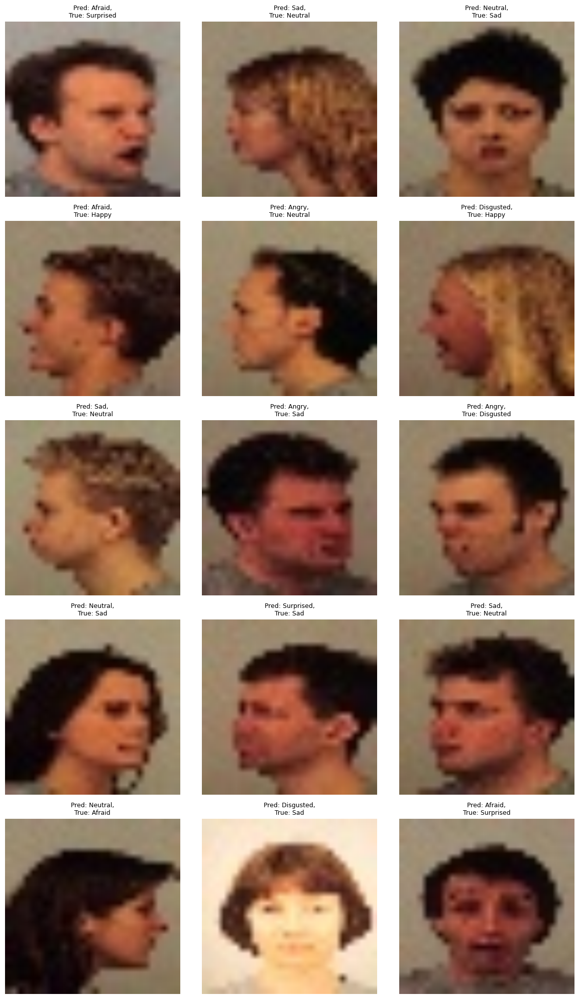




------------------------------------
 Accuracies  [0.7673469387755103, 0.7469387755102042]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.25it/s]


train Loss: 1.8308 Acc: 0.2673


100%|██████████| 16/16 [00:00<00:00, 19.48it/s]


val Loss: 1.4611 Acc: 0.4388

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.26it/s]


train Loss: 1.1831 Acc: 0.5612


100%|██████████| 16/16 [00:00<00:00, 21.14it/s]


val Loss: 1.0640 Acc: 0.5714

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.28it/s]


train Loss: 0.8821 Acc: 0.6608


100%|██████████| 16/16 [00:00<00:00, 20.82it/s]


val Loss: 0.9227 Acc: 0.6367

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.14it/s]


train Loss: 0.7061 Acc: 0.7397


100%|██████████| 16/16 [00:00<00:00, 21.33it/s]


val Loss: 0.8799 Acc: 0.6408

Epoch 4/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.42it/s]


train Loss: 0.5772 Acc: 0.7975


100%|██████████| 16/16 [00:00<00:00, 19.81it/s]


val Loss: 0.8308 Acc: 0.6796

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.02it/s]


train Loss: 0.4204 Acc: 0.8608


100%|██████████| 16/16 [00:00<00:00, 21.34it/s]


val Loss: 0.7166 Acc: 0.7265

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.28it/s]


train Loss: 0.3803 Acc: 0.8780


100%|██████████| 16/16 [00:00<00:00, 20.48it/s]


val Loss: 0.6863 Acc: 0.7245

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.23it/s]


train Loss: 0.3539 Acc: 0.8934


100%|██████████| 16/16 [00:00<00:00, 20.29it/s]


val Loss: 0.7039 Acc: 0.7327

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.21it/s]


train Loss: 0.3395 Acc: 0.8959


100%|██████████| 16/16 [00:00<00:00, 19.77it/s]


val Loss: 0.6883 Acc: 0.7347

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.21it/s]


train Loss: 0.3322 Acc: 0.9005


100%|██████████| 16/16 [00:00<00:00, 21.20it/s]


val Loss: 0.7079 Acc: 0.7245

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.20it/s]


train Loss: 0.3152 Acc: 0.9073


100%|██████████| 16/16 [00:00<00:00, 20.28it/s]


val Loss: 0.6939 Acc: 0.7286

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.24it/s]


train Loss: 0.2888 Acc: 0.9213


100%|██████████| 16/16 [00:00<00:00, 21.79it/s]


val Loss: 0.6921 Acc: 0.7306

Epoch 12/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.46it/s]


train Loss: 0.2968 Acc: 0.9159


100%|██████████| 16/16 [00:00<00:00, 20.85it/s]


val Loss: 0.6881 Acc: 0.7347

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.23it/s]


train Loss: 0.2833 Acc: 0.9240


100%|██████████| 16/16 [00:00<00:00, 19.14it/s]


val Loss: 0.6952 Acc: 0.7327

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.17it/s]


train Loss: 0.2795 Acc: 0.9268


100%|██████████| 16/16 [00:00<00:00, 19.95it/s]


val Loss: 0.6983 Acc: 0.7327

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.09it/s]


train Loss: 0.2855 Acc: 0.9222


100%|██████████| 16/16 [00:00<00:00, 21.22it/s]


val Loss: 0.6871 Acc: 0.7449

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.32it/s]


train Loss: 0.2830 Acc: 0.9195


100%|██████████| 16/16 [00:00<00:00, 19.65it/s]


val Loss: 0.6934 Acc: 0.7347

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.31it/s]


train Loss: 0.2823 Acc: 0.9220


100%|██████████| 16/16 [00:00<00:00, 21.44it/s]


val Loss: 0.6981 Acc: 0.7367

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.13it/s]


train Loss: 0.2783 Acc: 0.9213


100%|██████████| 16/16 [00:00<00:00, 19.04it/s]


val Loss: 0.6919 Acc: 0.7367

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.11it/s]


train Loss: 0.2805 Acc: 0.9215


100%|██████████| 16/16 [00:00<00:00, 21.41it/s]


val Loss: 0.6966 Acc: 0.7408

Training complete in 3m 18s
Best val Acc: 0.744898
Showing misclassified examples for fold 2...


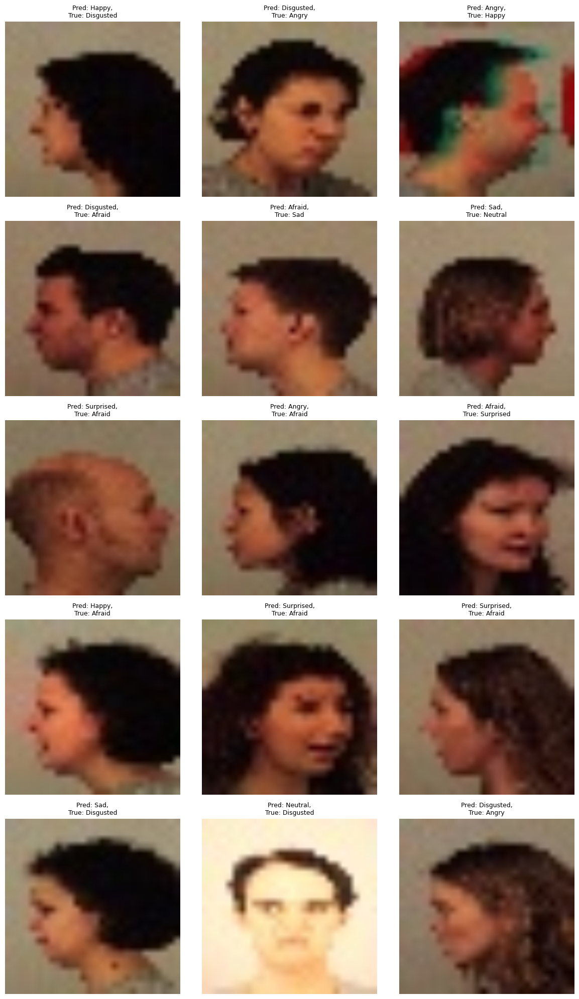




------------------------------------
 Accuracies  [0.7673469387755103, 0.7469387755102042, 0.7448979591836735]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.16it/s]


train Loss: 1.8172 Acc: 0.2773


100%|██████████| 16/16 [00:00<00:00, 19.20it/s]


val Loss: 1.4907 Acc: 0.4082

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.24it/s]


train Loss: 1.2272 Acc: 0.5367


100%|██████████| 16/16 [00:00<00:00, 20.99it/s]


val Loss: 1.0776 Acc: 0.5837

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.30it/s]


train Loss: 0.9172 Acc: 0.6542


100%|██████████| 16/16 [00:00<00:00, 19.73it/s]


val Loss: 0.9729 Acc: 0.6265

Epoch 3/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.38it/s]


train Loss: 0.7558 Acc: 0.7156


100%|██████████| 16/16 [00:00<00:00, 21.22it/s]


val Loss: 0.9114 Acc: 0.6408

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.28it/s]


train Loss: 0.6311 Acc: 0.7737


100%|██████████| 16/16 [00:00<00:00, 21.39it/s]


val Loss: 0.8612 Acc: 0.6653

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.19it/s]


train Loss: 0.4631 Acc: 0.8469


100%|██████████| 16/16 [00:00<00:00, 19.97it/s]


val Loss: 0.7866 Acc: 0.7020

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.26it/s]


train Loss: 0.4209 Acc: 0.8660


100%|██████████| 16/16 [00:00<00:00, 21.07it/s]


val Loss: 0.7671 Acc: 0.7041

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.30it/s]


train Loss: 0.3910 Acc: 0.8810


100%|██████████| 16/16 [00:00<00:00, 21.26it/s]


val Loss: 0.7888 Acc: 0.6898

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.07it/s]


train Loss: 0.3774 Acc: 0.8859


100%|██████████| 16/16 [00:00<00:00, 19.96it/s]


val Loss: 0.7683 Acc: 0.7102

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.33it/s]


train Loss: 0.3578 Acc: 0.8921


100%|██████████| 16/16 [00:00<00:00, 18.40it/s]


val Loss: 0.7534 Acc: 0.7163

Epoch 10/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.34it/s]


train Loss: 0.3322 Acc: 0.9032


100%|██████████| 16/16 [00:00<00:00, 21.50it/s]


val Loss: 0.7692 Acc: 0.7122

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.26it/s]


train Loss: 0.3200 Acc: 0.9118


100%|██████████| 16/16 [00:00<00:00, 21.56it/s]


val Loss: 0.7611 Acc: 0.7082

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.26it/s]


train Loss: 0.3192 Acc: 0.9122


100%|██████████| 16/16 [00:00<00:00, 21.34it/s]


val Loss: 0.7455 Acc: 0.7245

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.32it/s]


train Loss: 0.3074 Acc: 0.9141


100%|██████████| 16/16 [00:00<00:00, 21.47it/s]


val Loss: 0.7497 Acc: 0.7265

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.26it/s]


train Loss: 0.3142 Acc: 0.9120


100%|██████████| 16/16 [00:00<00:00, 21.25it/s]


val Loss: 0.7510 Acc: 0.7143

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.30it/s]


train Loss: 0.3116 Acc: 0.9159


100%|██████████| 16/16 [00:00<00:00, 21.33it/s]


val Loss: 0.7633 Acc: 0.7102

Epoch 16/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.40it/s]


train Loss: 0.3081 Acc: 0.9138


100%|██████████| 16/16 [00:00<00:00, 18.99it/s]


val Loss: 0.7558 Acc: 0.7061

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.26it/s]


train Loss: 0.2984 Acc: 0.9181


100%|██████████| 16/16 [00:00<00:00, 21.08it/s]


val Loss: 0.7518 Acc: 0.7224

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.26it/s]


train Loss: 0.3071 Acc: 0.9172


100%|██████████| 16/16 [00:00<00:00, 21.30it/s]


val Loss: 0.7555 Acc: 0.7102

Epoch 19/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.46it/s]


train Loss: 0.3108 Acc: 0.9134


100%|██████████| 16/16 [00:00<00:00, 19.87it/s]


val Loss: 0.7615 Acc: 0.7061

Training complete in 3m 18s
Best val Acc: 0.726531
Showing misclassified examples for fold 3...


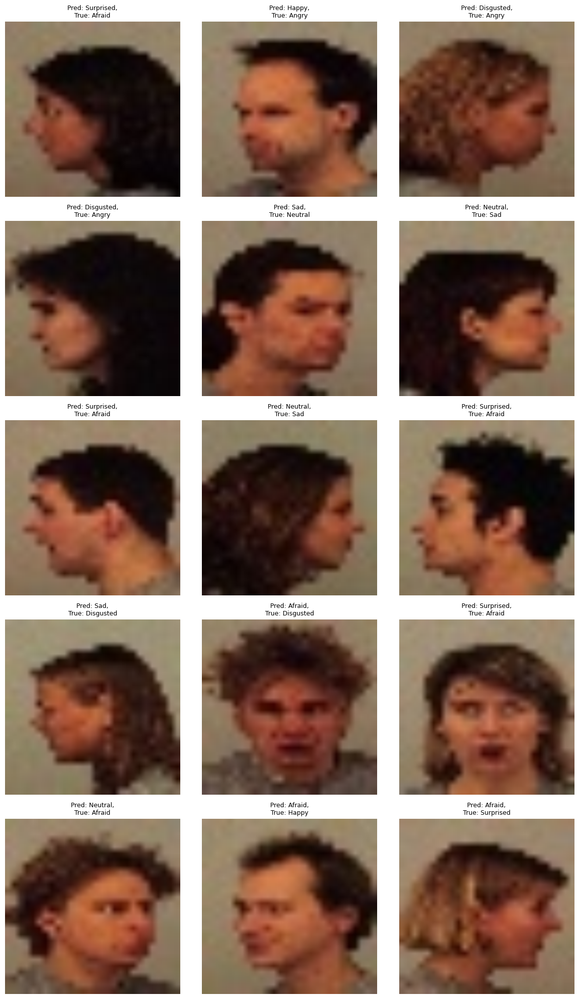




------------------------------------
 Accuracies  [0.7673469387755103, 0.7469387755102042, 0.7448979591836735, 0.726530612244898]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.33it/s]


train Loss: 1.8199 Acc: 0.2621


100%|██████████| 16/16 [00:00<00:00, 21.50it/s]


val Loss: 1.5026 Acc: 0.4429

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.06it/s]


train Loss: 1.2238 Acc: 0.5395


100%|██████████| 16/16 [00:00<00:00, 20.62it/s]


val Loss: 1.1347 Acc: 0.6061

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.00it/s]


train Loss: 0.9282 Acc: 0.6447


100%|██████████| 16/16 [00:00<00:00, 20.28it/s]


val Loss: 0.9921 Acc: 0.6082

Epoch 3/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.36it/s]


train Loss: 0.7578 Acc: 0.7247


100%|██████████| 16/16 [00:00<00:00, 20.50it/s]


val Loss: 0.8150 Acc: 0.6918

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.17it/s]


train Loss: 0.6203 Acc: 0.7692


100%|██████████| 16/16 [00:00<00:00, 19.36it/s]


val Loss: 0.8487 Acc: 0.6857

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.11it/s]


train Loss: 0.4536 Acc: 0.8524


100%|██████████| 16/16 [00:00<00:00, 19.82it/s]


val Loss: 0.6216 Acc: 0.7796

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.99it/s]


train Loss: 0.4157 Acc: 0.8721


100%|██████████| 16/16 [00:00<00:00, 21.56it/s]


val Loss: 0.6165 Acc: 0.7816

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.29it/s]


train Loss: 0.3958 Acc: 0.8753


100%|██████████| 16/16 [00:00<00:00, 21.17it/s]


val Loss: 0.6049 Acc: 0.7878

Epoch 8/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.36it/s]


train Loss: 0.3784 Acc: 0.8844


100%|██████████| 16/16 [00:00<00:00, 21.24it/s]


val Loss: 0.5972 Acc: 0.7878

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.19it/s]


train Loss: 0.3566 Acc: 0.8959


100%|██████████| 16/16 [00:00<00:00, 19.91it/s]


val Loss: 0.5922 Acc: 0.7959

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.04it/s]


train Loss: 0.3392 Acc: 0.8977


100%|██████████| 16/16 [00:00<00:00, 19.63it/s]


val Loss: 0.5912 Acc: 0.7980

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.30it/s]


train Loss: 0.3273 Acc: 0.9104


100%|██████████| 16/16 [00:00<00:00, 18.70it/s]


val Loss: 0.5930 Acc: 0.7939

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.23it/s]


train Loss: 0.3193 Acc: 0.9068


100%|██████████| 16/16 [00:00<00:00, 21.25it/s]


val Loss: 0.5880 Acc: 0.7939

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.98it/s]


train Loss: 0.3255 Acc: 0.9068


100%|██████████| 16/16 [00:00<00:00, 21.03it/s]


val Loss: 0.5909 Acc: 0.8000

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.03it/s]


train Loss: 0.3149 Acc: 0.9079


100%|██████████| 16/16 [00:00<00:00, 20.02it/s]


val Loss: 0.5923 Acc: 0.7980

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.99it/s]


train Loss: 0.3108 Acc: 0.9143


100%|██████████| 16/16 [00:00<00:00, 21.04it/s]


val Loss: 0.5873 Acc: 0.7898

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.08it/s]


train Loss: 0.3105 Acc: 0.9154


100%|██████████| 16/16 [00:00<00:00, 20.14it/s]


val Loss: 0.5821 Acc: 0.7898

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.21it/s]


train Loss: 0.3108 Acc: 0.9141


100%|██████████| 16/16 [00:00<00:00, 20.34it/s]


val Loss: 0.5878 Acc: 0.7959

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.26it/s]


train Loss: 0.3088 Acc: 0.9132


100%|██████████| 16/16 [00:00<00:00, 18.80it/s]


val Loss: 0.5866 Acc: 0.7857

Epoch 19/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.43it/s]


train Loss: 0.3234 Acc: 0.9048


100%|██████████| 16/16 [00:00<00:00, 21.38it/s]


val Loss: 0.5870 Acc: 0.7918

Training complete in 3m 19s
Best val Acc: 0.800000
Showing misclassified examples for fold 4...


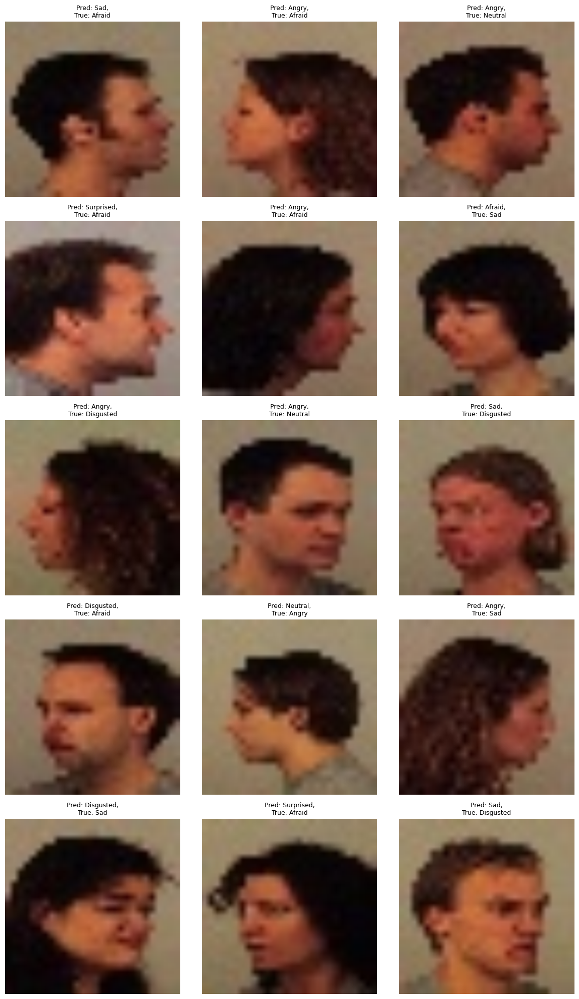




------------------------------------
 Accuracies  [0.7673469387755103, 0.7469387755102042, 0.7448979591836735, 0.726530612244898, 0.8]



Epoch 0/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.42it/s]


train Loss: 1.8289 Acc: 0.2576


100%|██████████| 16/16 [00:00<00:00, 20.21it/s]


val Loss: 1.5329 Acc: 0.4102

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.15it/s]


train Loss: 1.2247 Acc: 0.5424


100%|██████████| 16/16 [00:00<00:00, 20.48it/s]


val Loss: 1.0554 Acc: 0.5776

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.97it/s]


train Loss: 0.9048 Acc: 0.6578


100%|██████████| 16/16 [00:00<00:00, 21.35it/s]


val Loss: 0.9408 Acc: 0.6286

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.83it/s]


train Loss: 0.7286 Acc: 0.7324


100%|██████████| 16/16 [00:00<00:00, 21.27it/s]


val Loss: 0.8864 Acc: 0.6694

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.28it/s]


train Loss: 0.5872 Acc: 0.7846


100%|██████████| 16/16 [00:00<00:00, 20.17it/s]


val Loss: 0.9357 Acc: 0.6653

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.27it/s]


train Loss: 0.4248 Acc: 0.8585


100%|██████████| 16/16 [00:00<00:00, 20.28it/s]


val Loss: 0.7412 Acc: 0.7143

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.08it/s]


train Loss: 0.3889 Acc: 0.8782


100%|██████████| 16/16 [00:00<00:00, 21.27it/s]


val Loss: 0.7204 Acc: 0.7143

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.27it/s]


train Loss: 0.3644 Acc: 0.8884


100%|██████████| 16/16 [00:00<00:00, 20.34it/s]


val Loss: 0.7179 Acc: 0.7143

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.17it/s]


train Loss: 0.3539 Acc: 0.8900


100%|██████████| 16/16 [00:00<00:00, 21.07it/s]


val Loss: 0.7077 Acc: 0.7286

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.97it/s]


train Loss: 0.3284 Acc: 0.9005


100%|██████████| 16/16 [00:00<00:00, 19.16it/s]


val Loss: 0.7040 Acc: 0.7367

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.80it/s]


train Loss: 0.3135 Acc: 0.9043


100%|██████████| 16/16 [00:00<00:00, 21.07it/s]


val Loss: 0.6985 Acc: 0.7327

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.86it/s]


train Loss: 0.3066 Acc: 0.9093


100%|██████████| 16/16 [00:00<00:00, 19.86it/s]


val Loss: 0.7034 Acc: 0.7204

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.93it/s]


train Loss: 0.2976 Acc: 0.9177


100%|██████████| 16/16 [00:00<00:00, 21.26it/s]


val Loss: 0.7032 Acc: 0.7388

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.08it/s]


train Loss: 0.2953 Acc: 0.9147


100%|██████████| 16/16 [00:00<00:00, 18.87it/s]


val Loss: 0.7056 Acc: 0.7306

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.10it/s]


train Loss: 0.2996 Acc: 0.9168


100%|██████████| 16/16 [00:00<00:00, 19.10it/s]


val Loss: 0.7053 Acc: 0.7286

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.20it/s]


train Loss: 0.2930 Acc: 0.9170


100%|██████████| 16/16 [00:00<00:00, 20.36it/s]


val Loss: 0.7030 Acc: 0.7408

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.05it/s]


train Loss: 0.2939 Acc: 0.9172


100%|██████████| 16/16 [00:00<00:00, 21.07it/s]


val Loss: 0.7026 Acc: 0.7306

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.95it/s]


train Loss: 0.2865 Acc: 0.9236


100%|██████████| 16/16 [00:00<00:00, 20.28it/s]


val Loss: 0.7021 Acc: 0.7327

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.86it/s]


train Loss: 0.2934 Acc: 0.9177


100%|██████████| 16/16 [00:00<00:00, 19.48it/s]


val Loss: 0.6968 Acc: 0.7408

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.93it/s]


train Loss: 0.2904 Acc: 0.9197


100%|██████████| 16/16 [00:00<00:00, 20.14it/s]


val Loss: 0.7062 Acc: 0.7224

Training complete in 3m 20s
Best val Acc: 0.740816
Showing misclassified examples for fold 5...


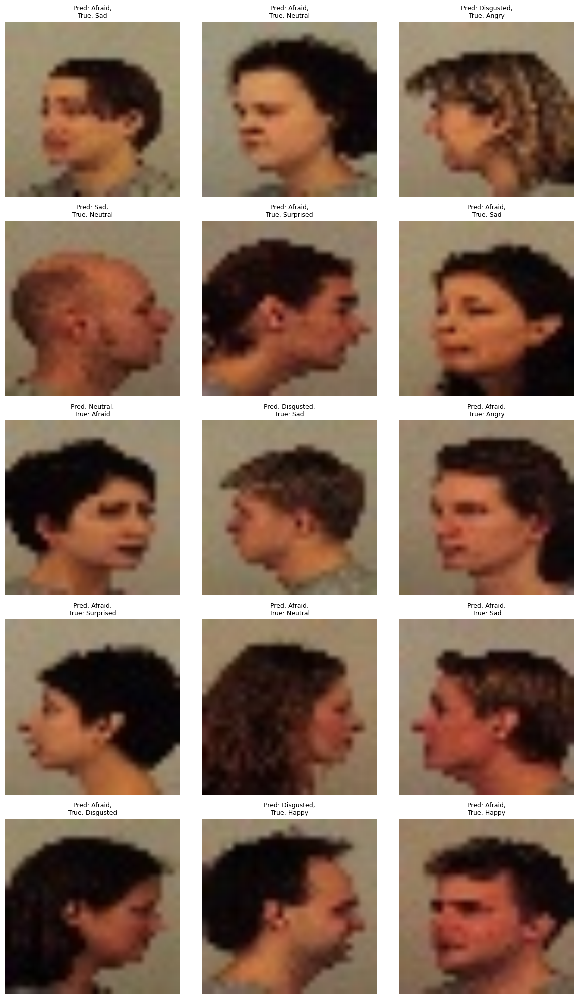




------------------------------------
 Accuracies  [0.7673469387755103, 0.7469387755102042, 0.7448979591836735, 0.726530612244898, 0.8, 0.7408163265306124]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.87it/s]


train Loss: 1.8425 Acc: 0.2592


100%|██████████| 16/16 [00:00<00:00, 21.13it/s]


val Loss: 1.5132 Acc: 0.4082

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.01it/s]


train Loss: 1.2352 Acc: 0.5351


100%|██████████| 16/16 [00:00<00:00, 21.68it/s]


val Loss: 1.1373 Acc: 0.5714

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.81it/s]


train Loss: 0.9218 Acc: 0.6580


100%|██████████| 16/16 [00:00<00:00, 21.33it/s]


val Loss: 0.9859 Acc: 0.6408

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.31it/s]


train Loss: 0.7529 Acc: 0.7213


100%|██████████| 16/16 [00:00<00:00, 19.14it/s]


val Loss: 0.9400 Acc: 0.6714

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.19it/s]


train Loss: 0.6107 Acc: 0.7807


100%|██████████| 16/16 [00:00<00:00, 21.30it/s]


val Loss: 0.9868 Acc: 0.6612

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.91it/s]


train Loss: 0.4672 Acc: 0.8490


100%|██████████| 16/16 [00:00<00:00, 19.17it/s]


val Loss: 0.8035 Acc: 0.7143

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.99it/s]


train Loss: 0.3996 Acc: 0.8744


100%|██████████| 16/16 [00:00<00:00, 21.52it/s]


val Loss: 0.8044 Acc: 0.7286

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.94it/s]


train Loss: 0.3773 Acc: 0.8848


100%|██████████| 16/16 [00:00<00:00, 20.12it/s]


val Loss: 0.7851 Acc: 0.7286

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.07it/s]


train Loss: 0.3565 Acc: 0.8900


100%|██████████| 16/16 [00:00<00:00, 20.26it/s]


val Loss: 0.7845 Acc: 0.7306

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.97it/s]


train Loss: 0.3351 Acc: 0.9041


100%|██████████| 16/16 [00:00<00:00, 20.70it/s]


val Loss: 0.7753 Acc: 0.7306

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.32it/s]


train Loss: 0.3344 Acc: 0.9011


100%|██████████| 16/16 [00:00<00:00, 19.89it/s]


val Loss: 0.7760 Acc: 0.7327

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.27it/s]


train Loss: 0.3101 Acc: 0.9132


100%|██████████| 16/16 [00:00<00:00, 20.54it/s]


val Loss: 0.7785 Acc: 0.7306

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.90it/s]


train Loss: 0.3065 Acc: 0.9138


100%|██████████| 16/16 [00:00<00:00, 21.62it/s]


val Loss: 0.7840 Acc: 0.7306

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.00it/s]


train Loss: 0.3028 Acc: 0.9125


100%|██████████| 16/16 [00:00<00:00, 20.88it/s]


val Loss: 0.7818 Acc: 0.7306

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.88it/s]


train Loss: 0.3002 Acc: 0.9154


100%|██████████| 16/16 [00:00<00:00, 21.15it/s]


val Loss: 0.7760 Acc: 0.7286

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.09it/s]


train Loss: 0.3051 Acc: 0.9116


100%|██████████| 16/16 [00:00<00:00, 20.92it/s]


val Loss: 0.7857 Acc: 0.7286

Epoch 16/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.46it/s]


train Loss: 0.2954 Acc: 0.9188


100%|██████████| 16/16 [00:00<00:00, 19.47it/s]


val Loss: 0.7734 Acc: 0.7367

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.94it/s]


train Loss: 0.2942 Acc: 0.9220


100%|██████████| 16/16 [00:00<00:00, 18.97it/s]


val Loss: 0.7768 Acc: 0.7327

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.03it/s]


train Loss: 0.3022 Acc: 0.9161


100%|██████████| 16/16 [00:00<00:00, 20.15it/s]


val Loss: 0.7729 Acc: 0.7327

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.17it/s]


train Loss: 0.3019 Acc: 0.9086


100%|██████████| 16/16 [00:00<00:00, 21.58it/s]


val Loss: 0.7747 Acc: 0.7286

Training complete in 3m 20s
Best val Acc: 0.736735
Showing misclassified examples for fold 6...


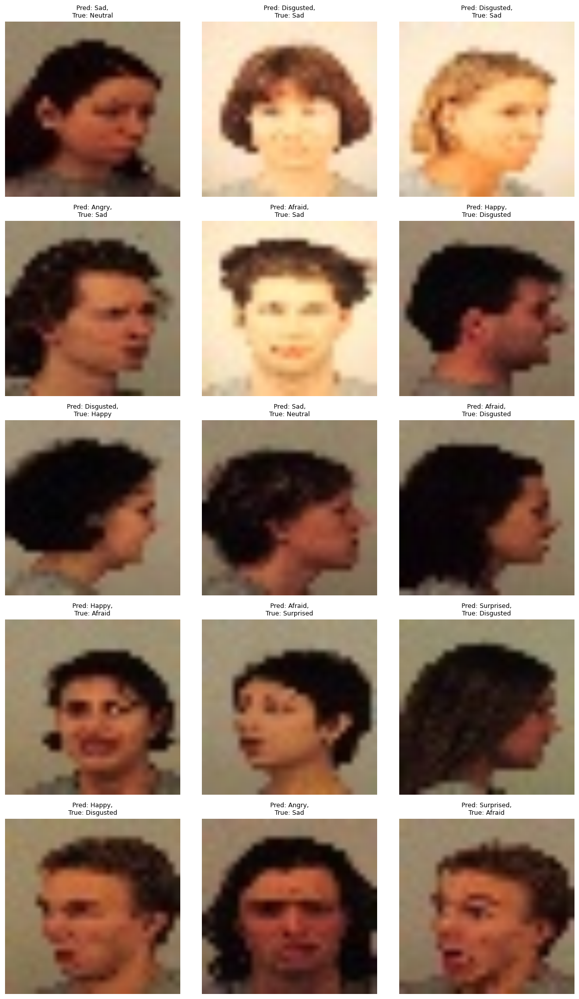




------------------------------------
 Accuracies  [0.7673469387755103, 0.7469387755102042, 0.7448979591836735, 0.726530612244898, 0.8, 0.7408163265306124, 0.7367346938775511]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.10it/s]


train Loss: 1.8250 Acc: 0.2637


100%|██████████| 16/16 [00:00<00:00, 20.97it/s]


val Loss: 1.5159 Acc: 0.4082

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.95it/s]


train Loss: 1.2438 Acc: 0.5327


100%|██████████| 16/16 [00:00<00:00, 19.57it/s]


val Loss: 1.0412 Acc: 0.6143

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.86it/s]


train Loss: 0.9041 Acc: 0.6603


100%|██████████| 16/16 [00:00<00:00, 20.52it/s]


val Loss: 0.9114 Acc: 0.6612

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.80it/s]


train Loss: 0.7460 Acc: 0.7268


100%|██████████| 16/16 [00:00<00:00, 20.04it/s]


val Loss: 0.8180 Acc: 0.6918

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.22it/s]


train Loss: 0.5954 Acc: 0.7828


100%|██████████| 16/16 [00:00<00:00, 21.20it/s]


val Loss: 0.7957 Acc: 0.6673

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.16it/s]


train Loss: 0.4499 Acc: 0.8492


100%|██████████| 16/16 [00:00<00:00, 21.11it/s]


val Loss: 0.6685 Acc: 0.7408

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.70it/s]


train Loss: 0.3982 Acc: 0.8753


100%|██████████| 16/16 [00:00<00:00, 20.98it/s]


val Loss: 0.6564 Acc: 0.7469

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.25it/s]


train Loss: 0.3753 Acc: 0.8816


100%|██████████| 16/16 [00:00<00:00, 18.72it/s]


val Loss: 0.6548 Acc: 0.7531

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.92it/s]


train Loss: 0.3573 Acc: 0.8873


100%|██████████| 16/16 [00:00<00:00, 21.24it/s]


val Loss: 0.6554 Acc: 0.7633

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.92it/s]


train Loss: 0.3448 Acc: 0.8980


100%|██████████| 16/16 [00:00<00:00, 19.77it/s]


val Loss: 0.6485 Acc: 0.7592

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.08it/s]


train Loss: 0.3275 Acc: 0.9025


100%|██████████| 16/16 [00:00<00:00, 21.12it/s]


val Loss: 0.6557 Acc: 0.7531

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.99it/s]


train Loss: 0.3060 Acc: 0.9125


100%|██████████| 16/16 [00:00<00:00, 19.94it/s]


val Loss: 0.6499 Acc: 0.7694

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.83it/s]


train Loss: 0.3036 Acc: 0.9091


100%|██████████| 16/16 [00:00<00:00, 20.23it/s]


val Loss: 0.6465 Acc: 0.7735

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.11it/s]


train Loss: 0.3002 Acc: 0.9122


100%|██████████| 16/16 [00:00<00:00, 19.80it/s]


val Loss: 0.6452 Acc: 0.7755

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.79it/s]


train Loss: 0.3037 Acc: 0.9154


100%|██████████| 16/16 [00:00<00:00, 19.91it/s]


val Loss: 0.6478 Acc: 0.7571

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.08it/s]


train Loss: 0.3052 Acc: 0.9118


100%|██████████| 16/16 [00:00<00:00, 21.06it/s]


val Loss: 0.6463 Acc: 0.7612

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.91it/s]


train Loss: 0.2938 Acc: 0.9175


100%|██████████| 16/16 [00:00<00:00, 21.25it/s]


val Loss: 0.6487 Acc: 0.7612

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.25it/s]


train Loss: 0.2908 Acc: 0.9179


100%|██████████| 16/16 [00:00<00:00, 19.44it/s]


val Loss: 0.6443 Acc: 0.7633

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.00it/s]


train Loss: 0.3006 Acc: 0.9154


100%|██████████| 16/16 [00:00<00:00, 21.03it/s]


val Loss: 0.6484 Acc: 0.7714

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.86it/s]


train Loss: 0.2960 Acc: 0.9145


100%|██████████| 16/16 [00:00<00:00, 21.26it/s]


val Loss: 0.6428 Acc: 0.7633

Training complete in 3m 21s
Best val Acc: 0.775510
Showing misclassified examples for fold 7...


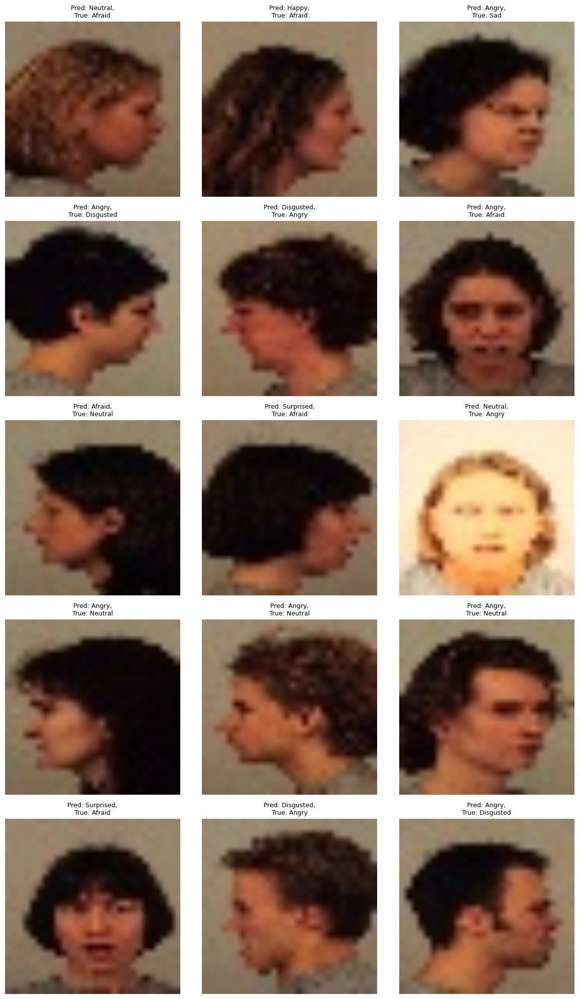




------------------------------------
 Accuracies  [0.7673469387755103, 0.7469387755102042, 0.7448979591836735, 0.726530612244898, 0.8, 0.7408163265306124, 0.7367346938775511, 0.7755102040816327]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.99it/s]


train Loss: 1.7851 Acc: 0.2830


100%|██████████| 16/16 [00:00<00:00, 20.92it/s]


val Loss: 1.4306 Acc: 0.4265

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.16it/s]


train Loss: 1.1941 Acc: 0.5422


100%|██████████| 16/16 [00:00<00:00, 21.16it/s]


val Loss: 1.1638 Acc: 0.5449

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.05it/s]


train Loss: 0.9030 Acc: 0.6560


100%|██████████| 16/16 [00:00<00:00, 19.58it/s]


val Loss: 1.0178 Acc: 0.5837

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.08it/s]


train Loss: 0.7253 Acc: 0.7274


100%|██████████| 16/16 [00:00<00:00, 19.38it/s]


val Loss: 0.8867 Acc: 0.6592

Epoch 4/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.38it/s]


train Loss: 0.6125 Acc: 0.7703


100%|██████████| 16/16 [00:00<00:00, 21.19it/s]


val Loss: 0.8759 Acc: 0.6571

Epoch 5/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.04it/s]


train Loss: 0.4414 Acc: 0.8560


100%|██████████| 16/16 [00:00<00:00, 20.34it/s]


val Loss: 0.7775 Acc: 0.7061

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.25it/s]


train Loss: 0.4055 Acc: 0.8728


100%|██████████| 16/16 [00:00<00:00, 18.79it/s]


val Loss: 0.7596 Acc: 0.7224

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.32it/s]


train Loss: 0.3829 Acc: 0.8816


100%|██████████| 16/16 [00:00<00:00, 21.59it/s]


val Loss: 0.7558 Acc: 0.7184

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.03it/s]


train Loss: 0.3455 Acc: 0.9018


100%|██████████| 16/16 [00:00<00:00, 21.43it/s]


val Loss: 0.7531 Acc: 0.7184

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.12it/s]


train Loss: 0.3434 Acc: 0.9039


100%|██████████| 16/16 [00:00<00:00, 20.34it/s]


val Loss: 0.7552 Acc: 0.7265

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.13it/s]


train Loss: 0.3280 Acc: 0.9036


100%|██████████| 16/16 [00:00<00:00, 19.22it/s]


val Loss: 0.7511 Acc: 0.7245

Epoch 11/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.40it/s]


train Loss: 0.3145 Acc: 0.9093


100%|██████████| 16/16 [00:00<00:00, 21.23it/s]


val Loss: 0.7472 Acc: 0.7122

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.02it/s]


train Loss: 0.3121 Acc: 0.9086


100%|██████████| 16/16 [00:00<00:00, 21.05it/s]


val Loss: 0.7448 Acc: 0.7265

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.04it/s]


train Loss: 0.3060 Acc: 0.9100


100%|██████████| 16/16 [00:00<00:00, 20.61it/s]


val Loss: 0.7474 Acc: 0.7122

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.23it/s]


train Loss: 0.3020 Acc: 0.9141


100%|██████████| 16/16 [00:00<00:00, 19.31it/s]


val Loss: 0.7426 Acc: 0.7163

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.12it/s]


train Loss: 0.3126 Acc: 0.9107


100%|██████████| 16/16 [00:00<00:00, 21.32it/s]


val Loss: 0.7435 Acc: 0.7163

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.32it/s]


train Loss: 0.3066 Acc: 0.9152


100%|██████████| 16/16 [00:00<00:00, 20.15it/s]


val Loss: 0.7518 Acc: 0.7143

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.31it/s]


train Loss: 0.3040 Acc: 0.9127


100%|██████████| 16/16 [00:00<00:00, 18.93it/s]


val Loss: 0.7409 Acc: 0.7245

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.30it/s]


train Loss: 0.2946 Acc: 0.9177


100%|██████████| 16/16 [00:00<00:00, 21.17it/s]


val Loss: 0.7491 Acc: 0.7245

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.90it/s]


train Loss: 0.3122 Acc: 0.9104


100%|██████████| 16/16 [00:00<00:00, 19.82it/s]


val Loss: 0.7494 Acc: 0.7286

Training complete in 3m 19s
Best val Acc: 0.728571
Showing misclassified examples for fold 8...


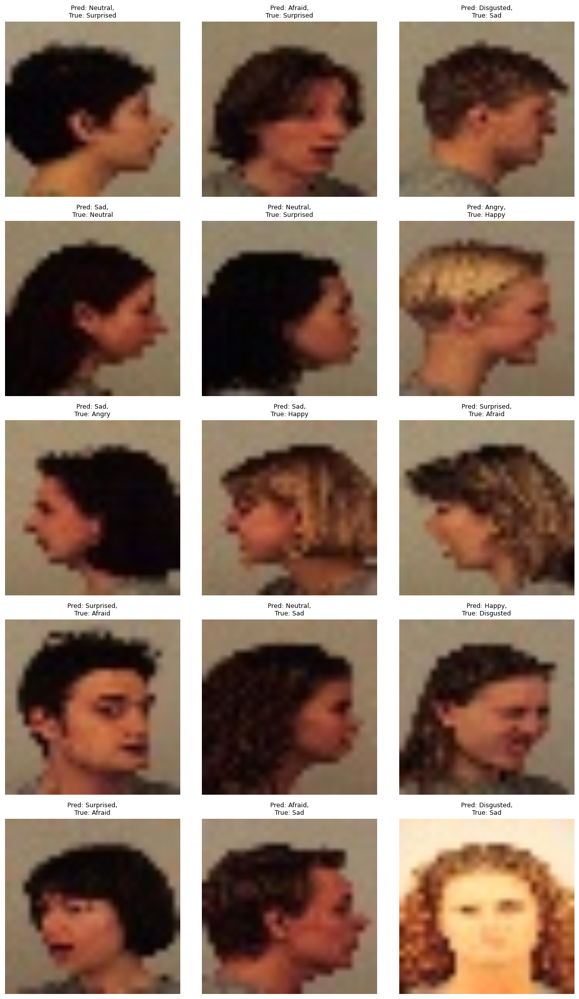




------------------------------------
 Accuracies  [0.7673469387755103, 0.7469387755102042, 0.7448979591836735, 0.726530612244898, 0.8, 0.7408163265306124, 0.7367346938775511, 0.7755102040816327, 0.7285714285714286]



Epoch 0/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.26it/s]


train Loss: 1.8075 Acc: 0.2696


100%|██████████| 16/16 [00:00<00:00, 21.38it/s]


val Loss: 1.4868 Acc: 0.4327

Epoch 1/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.19it/s]


train Loss: 1.1850 Acc: 0.5510


100%|██████████| 16/16 [00:00<00:00, 21.27it/s]


val Loss: 1.1681 Acc: 0.5571

Epoch 2/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.01it/s]


train Loss: 0.9090 Acc: 0.6553


100%|██████████| 16/16 [00:00<00:00, 21.06it/s]


val Loss: 1.0112 Acc: 0.6020

Epoch 3/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.24it/s]


train Loss: 0.7452 Acc: 0.7222


100%|██████████| 16/16 [00:00<00:00, 21.34it/s]


val Loss: 1.0678 Acc: 0.6245

Epoch 4/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.92it/s]


train Loss: 0.6013 Acc: 0.7751


100%|██████████| 16/16 [00:00<00:00, 20.30it/s]


val Loss: 0.7950 Acc: 0.6898

Epoch 5/19
----------


100%|██████████| 138/138 [00:08<00:00, 15.33it/s]


train Loss: 0.4444 Acc: 0.8580


100%|██████████| 16/16 [00:00<00:00, 20.33it/s]


val Loss: 0.7425 Acc: 0.7163

Epoch 6/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.22it/s]


train Loss: 0.4074 Acc: 0.8667


100%|██████████| 16/16 [00:00<00:00, 20.11it/s]


val Loss: 0.7460 Acc: 0.7102

Epoch 7/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.08it/s]


train Loss: 0.3825 Acc: 0.8776


100%|██████████| 16/16 [00:00<00:00, 19.75it/s]


val Loss: 0.7250 Acc: 0.7327

Epoch 8/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.88it/s]


train Loss: 0.3577 Acc: 0.8871


100%|██████████| 16/16 [00:00<00:00, 20.95it/s]


val Loss: 0.7120 Acc: 0.7265

Epoch 9/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.82it/s]


train Loss: 0.3471 Acc: 0.8914


100%|██████████| 16/16 [00:00<00:00, 20.18it/s]


val Loss: 0.7194 Acc: 0.7163

Epoch 10/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.79it/s]


train Loss: 0.3259 Acc: 0.8977


100%|██████████| 16/16 [00:00<00:00, 20.30it/s]


val Loss: 0.7282 Acc: 0.7327

Epoch 11/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.01it/s]


train Loss: 0.3123 Acc: 0.9070


100%|██████████| 16/16 [00:00<00:00, 20.92it/s]


val Loss: 0.7091 Acc: 0.7347

Epoch 12/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.93it/s]


train Loss: 0.3102 Acc: 0.9111


100%|██████████| 16/16 [00:00<00:00, 19.01it/s]


val Loss: 0.7163 Acc: 0.7286

Epoch 13/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.04it/s]


train Loss: 0.3046 Acc: 0.9152


100%|██████████| 16/16 [00:00<00:00, 18.52it/s]


val Loss: 0.7109 Acc: 0.7408

Epoch 14/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.77it/s]


train Loss: 0.2993 Acc: 0.9147


100%|██████████| 16/16 [00:00<00:00, 20.71it/s]


val Loss: 0.7046 Acc: 0.7327

Epoch 15/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.02it/s]


train Loss: 0.3026 Acc: 0.9125


100%|██████████| 16/16 [00:00<00:00, 18.93it/s]


val Loss: 0.7043 Acc: 0.7469

Epoch 16/19
----------


100%|██████████| 138/138 [00:09<00:00, 14.94it/s]


train Loss: 0.3042 Acc: 0.9161


100%|██████████| 16/16 [00:00<00:00, 21.12it/s]


val Loss: 0.7073 Acc: 0.7306

Epoch 17/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.10it/s]


train Loss: 0.3003 Acc: 0.9168


100%|██████████| 16/16 [00:00<00:00, 19.44it/s]


val Loss: 0.7119 Acc: 0.7306

Epoch 18/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.13it/s]


train Loss: 0.2998 Acc: 0.9213


100%|██████████| 16/16 [00:00<00:00, 20.86it/s]


val Loss: 0.7084 Acc: 0.7408

Epoch 19/19
----------


100%|██████████| 138/138 [00:09<00:00, 15.12it/s]


train Loss: 0.3109 Acc: 0.9125


100%|██████████| 16/16 [00:00<00:00, 20.92it/s]


val Loss: 0.7022 Acc: 0.7347

Training complete in 3m 21s
Best val Acc: 0.746939
Showing misclassified examples for fold 9...


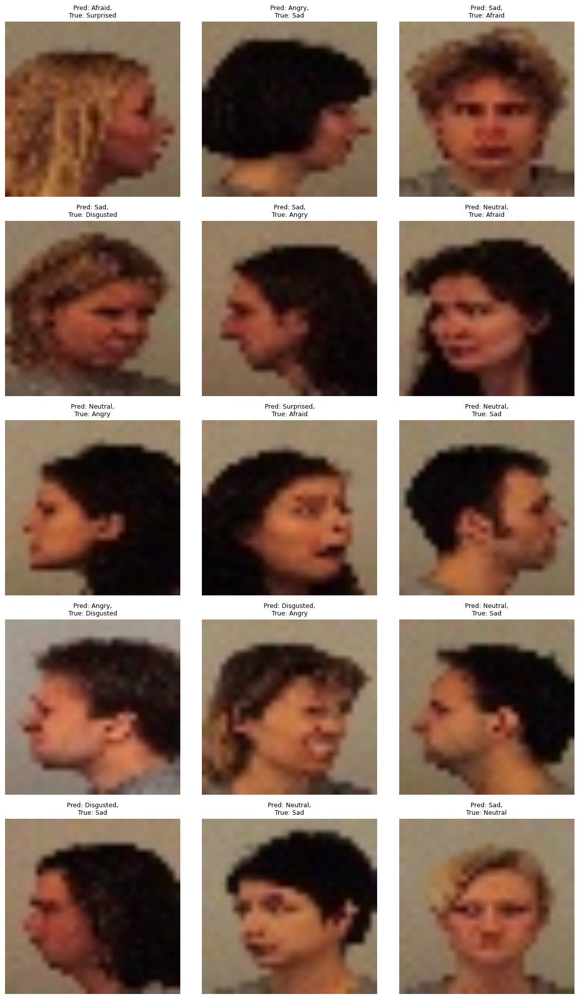




------------------------------------
 Accuracies  [0.7673469387755103, 0.7469387755102042, 0.7448979591836735, 0.726530612244898, 0.8, 0.7408163265306124, 0.7367346938775511, 0.7755102040816327, 0.7285714285714286, 0.7469387755102042]





In [11]:
accuracies = []
index = list(np.random.permutation(4900))

for i in range(10):
    idx = {
        'val': index[490 * i:490 * (i + 1)],
        'train': index[:i * 490] + index[((i + 1) * 490):]
    }

    dataloaders = {
        x: torch.utils.data.DataLoader(
            KDEFDataset(transforms_=data_transforms[x], idx=idx[x]),
            batch_size=32,
            shuffle=True
        )
        for x in ['train', 'val']
    }

    model_ft = models.resnet18(weights='IMAGENET1K_V1')
    num_ftrs = model_ft.fc.in_features
    model_ft.fc = nn.Linear(num_ftrs, class_names)
    model_ft = model_ft.to(device)

    criterion = nn.CrossEntropyLoss()
    optimizer_ft = optim.SGD(model_ft.parameters(), lr=0.001, momentum=0.9)
    exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=6, gamma=0.1)

    logdir = f'./logs/resnet18_kfold_{i}'
    os.makedirs(logdir, exist_ok=True)  # Ensure logs dir exists
    writer = SummaryWriter(logdir)

    # 🛠️ ensure "saved" directory exists before saving the model
    os.makedirs('saved', exist_ok=True)

    model_ft, best_acc = train_model(
        model_ft,
        criterion,
        optimizer_ft,
        exp_lr_scheduler,
        dataloaders,
        writer,
        i,
        num_epochs=20
    )

    # Save model
    torch.save(model_ft.state_dict(), f'saved/model_fold_{i}.pt')

    print(f"Showing misclassified examples for fold {i}...")
    visualize_model_misclassified(
    model=model_ft,
    dataloader=dataloaders['val'],
    class_names={
        0: "Afraid", 1: "Angry", 2: "Disgusted",
        3: "Happy", 4: "Neutral", 5: "Sad", 6: "Surprised"
    },
    save_dir=f'misclassified/fold_{i}',
    num_images=15,

)

    accuracies.append(float(best_acc.cpu().numpy()))
    print("\n\n\n------------------------------------\n Accuracies ", accuracies)
    print("\n\n")



In [12]:
from google.colab import files

!zip -r resnet18_28x28_logs_and_saved_misclassified.zip logs saved misclassified
files.download('resnet18_28x28_logs_and_saved_misclassified.zip')

  adding: logs/ (stored 0%)
  adding: logs/resnet18_kfold_3/ (stored 0%)
  adding: logs/resnet18_kfold_3/events.out.tfevents.1744893229.4da47abade64 (deflated 62%)
  adding: logs/resnet18_kfold_2/ (stored 0%)
  adding: logs/resnet18_kfold_2/events.out.tfevents.1744893028.4da47abade64 (deflated 62%)
  adding: logs/resnet18_kfold_4/ (stored 0%)
  adding: logs/resnet18_kfold_4/events.out.tfevents.1744893429.4da47abade64 (deflated 62%)
  adding: logs/resnet18_kfold_6/ (stored 0%)
  adding: logs/resnet18_kfold_6/events.out.tfevents.1744893834.4da47abade64 (deflated 62%)
  adding: logs/resnet18_kfold_7/ (stored 0%)
  adding: logs/resnet18_kfold_7/events.out.tfevents.1744894037.4da47abade64 (deflated 62%)
  adding: logs/resnet18_kfold_1/ (stored 0%)
  adding: logs/resnet18_kfold_1/events.out.tfevents.1744892832.4da47abade64 (deflated 62%)
  adding: logs/resnet18_kfold_5/ (stored 0%)
  adding: logs/resnet18_kfold_5/events.out.tfevents.1744893631.4da47abade64 (deflated 62%)
  adding: logs/resne

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>